#### Deep Image Prior

- Deep Image Prior showed the structure of a CNN is sufficient so solve image restoration problems, i.e. CNN contains “knowledge” of the natural image.

- Let $g$ is a mapping parametrized with $\theta$, the $g$ dramatically changes over how the optimization method searches the image space. We can actually treat $g$ as hyper parameter and tune it. And if we observe, $g(\theta)$ acts as a prior which helps in selecting a good mapping.

- In the paper, the authors showed that when gradient descent is used to optimize the network, the convolution neural network are reluctant to generate noisy images and would be optimized much more quickly and easily towards naturally-looking images.

<img src=attachment:image.png width=600><br>
<center>Fig. Image restoration using the deep image prior (<a href=https://dmitryulyanov.github.io/deep_image_prior>source</a>)</center>
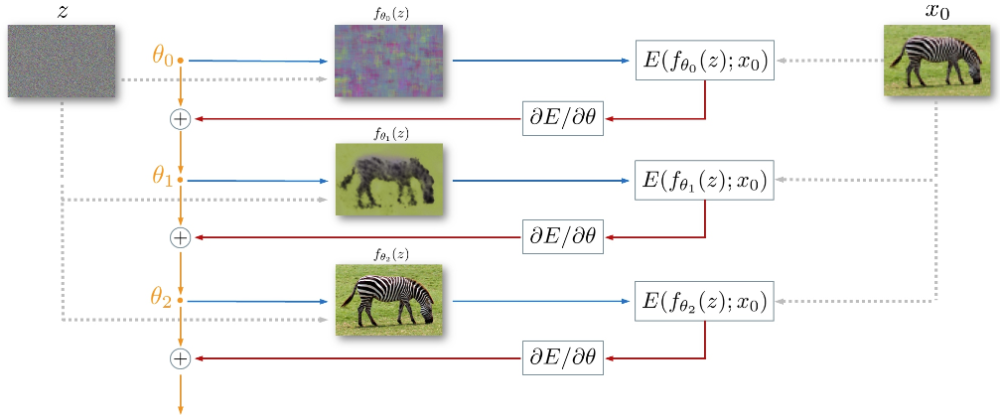

- Starting from a random weights $\theta_0$, we iteratively update them in order to minimize the loss. At every iteration the weights $\theta$ are mapped to an image $x=f_\theta(z)$, where $z$ is a fixed random noise.
- And finally when we find the optimal $\theta$, we can get the optimal image, by just forward passing the fixed input $z$ to the network with parameters $\theta$.

#### Learned and explicit priors

- Learned Prior: A network learns how to denoise images from a large data set (clean-noisy image pairs)
- Explicit Prior (handcrafted prior): No need to use any additional data other than the image.
    - For example, $x^*= argmin |x-\hat{x}|^2 + |\nabla x| $
    - Explicit prior here is that clean images should small amount of gradient. 
    - The data-term pulls the term towards the original image, making sure that the image does not deviate too far. In addition the right term pulls x in the direction of natural images (hopefully).
- The essence of this paper is that CNNs can be used as priors over images.
> The choice of regularizer $R(x)$, which usually captures a generic prior on natural images, is more difficult and is the subject of much research. As a simple example, $R(x)$ can be the Total Variation (TV) of the image, which encourages solutions to contain uniform regions. In this work, we replace the regularizer $R(x)$ with the **implicit prior** captured by the neural network.

#### Inpainting example

In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
# from models.resnet import ResNet
# from models.unet import UNet
# from models.skip import skip
import torch
import torch.optim

from util import *
from resnet import ResNet

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

PLOT = True
imsize = -1
dim_div_by = 64



In [2]:
img_path  = 'data/kate.png'
mask_path = 'data/kate_mask.png'

In [3]:
img_pil, img_np = get_image(img_path, imsize)
img_mask_pil, img_mask_np = get_image(mask_path, imsize)

In [4]:

img_mask_pil = crop_image(img_mask_pil, dim_div_by)
img_pil      = crop_image(img_pil,      dim_div_by)

img_np      = pil_to_np(img_pil)
img_mask_np = pil_to_np(img_mask_pil)

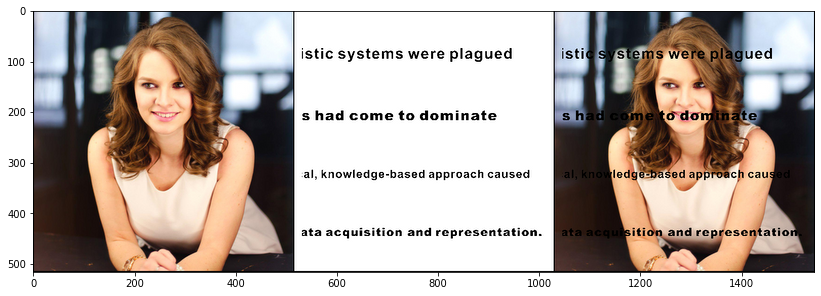

In [5]:
img_mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np*img_np], 3,11);

In [6]:
pad = 'reflection' # 'zero'
OPT_OVER = 'net'
OPTIMIZER = 'adam'

In [7]:
# Same params and net as in super-resolution and denoising
INPUT = 'noise'
input_depth = 32
LR = 0.01 
num_iter = 6001
param_noise = False
show_every = 500
figsize = 5
reg_noise_std = 0.03

In [8]:
net = ResNet(input_depth, img_np.shape[0], 8, 32, need_sigmoid=True, act_fun='LeakyReLU')

LR = 0.001
param_noise = False

In [9]:
net = net.type(dtype)
net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype)

In [10]:
# Compute number of parameters
s  = sum(np.prod(list(p.size())) for p in net.parameters())
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_var = np_to_torch(img_np).type(dtype)
mask_var = np_to_torch(img_mask_np).type(dtype)

Number of params: 167907


Starting optimization with ADAM


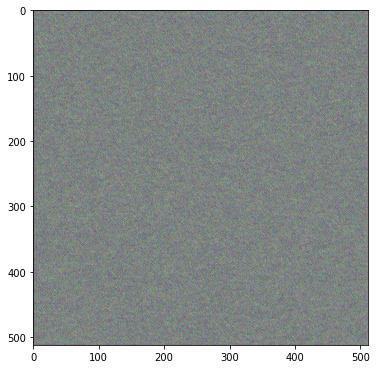

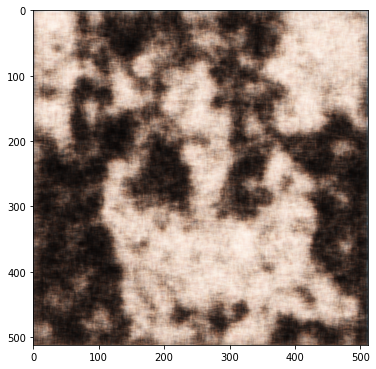

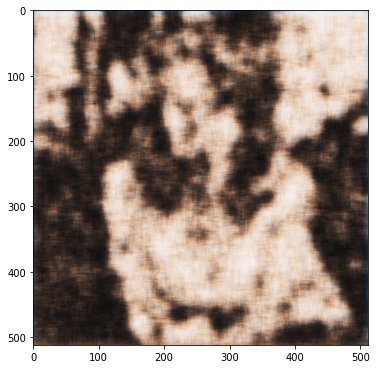

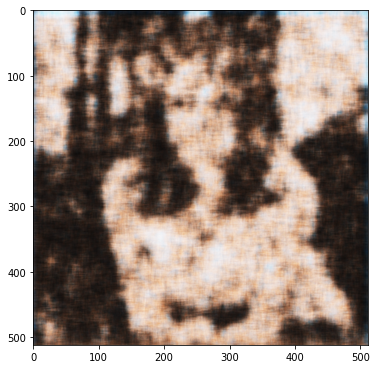

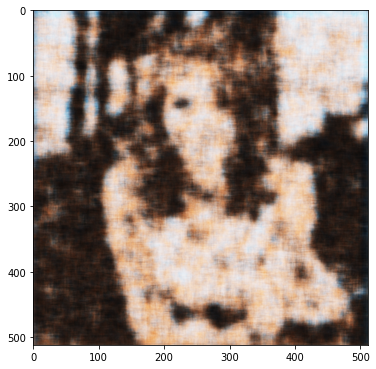

...

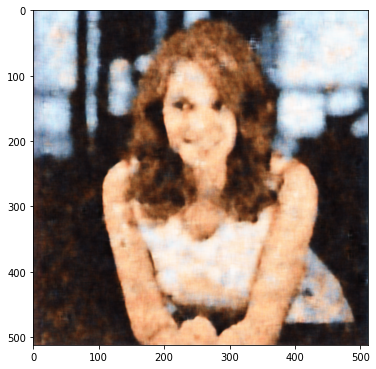

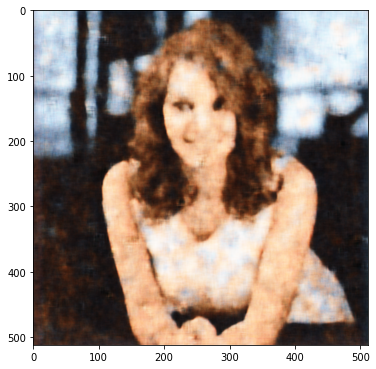

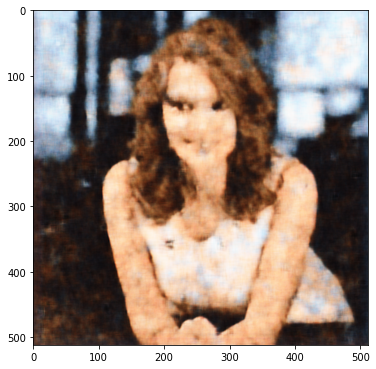

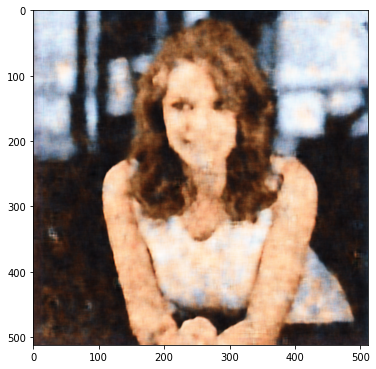

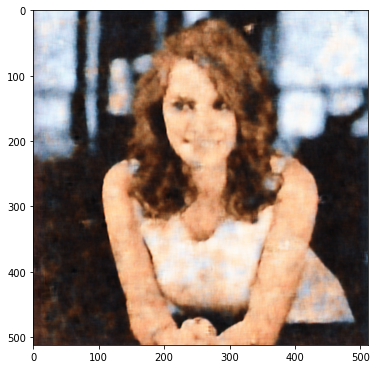

In [11]:
i = 0
def closure():
    
    global i
    
    if param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50
    
    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
        
        
    out = net(net_input)
   
    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()
        
    
    if (PLOT and i<=500 and i % 100 == 0) or (PLOT and i % show_every == 0):
        print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)
        
    i += 1

    return total_loss

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [12]:
img_path  = 'data/library.png'
mask_path = 'data/library_mask.png'

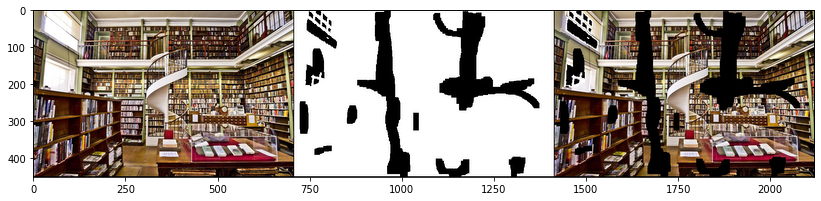

In [13]:
img_pil, img_np = get_image(img_path, imsize)
img_mask_pil, img_mask_np = get_image(mask_path, imsize)

img_mask_pil = crop_image(img_mask_pil, dim_div_by)
img_pil      = crop_image(img_pil,      dim_div_by)

img_np      = pil_to_np(img_pil)
img_mask_np = pil_to_np(img_mask_pil)

img_mask_var = np_to_torch(img_mask_np).type(dtype)
plot_image_grid([img_np, img_mask_np, img_mask_np*img_np], 3,11);

In [17]:
INPUT = 'noise'
input_depth = 1

num_iter = 3001
show_every = 300
figsize = 8
reg_noise_std = 0.00
param_noise = True

net = ResNet(input_depth, img_np.shape[0], 8, 32, need_sigmoid=True, act_fun='LeakyReLU')

LR = 0.001
param_noise = False

net = net.type(dtype)
net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype)

In [15]:
# Compute number of parameters
s  = sum(np.prod(list(p.size())) for p in net.parameters())
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_var = np_to_torch(img_np).type(dtype)
mask_var = np_to_torch(img_mask_np).type(dtype)

Number of params: 158979


Starting optimization with ADAM


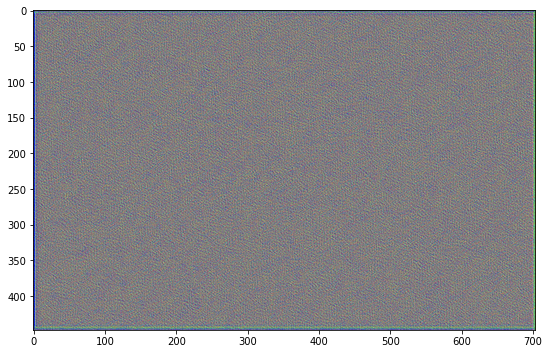

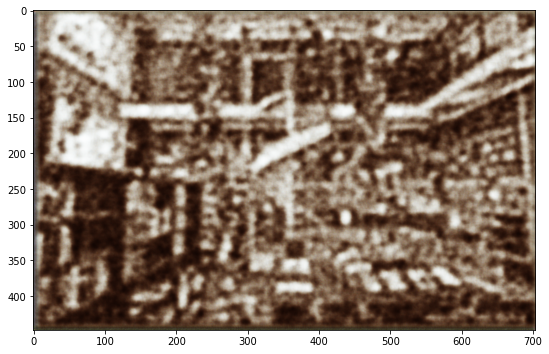

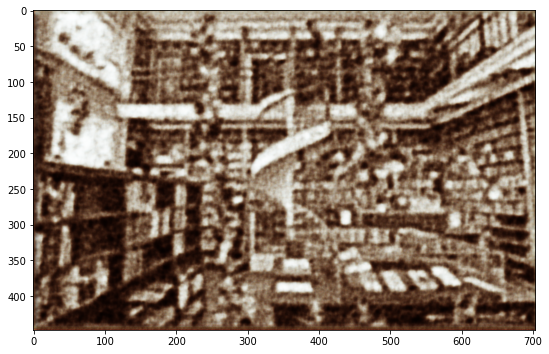

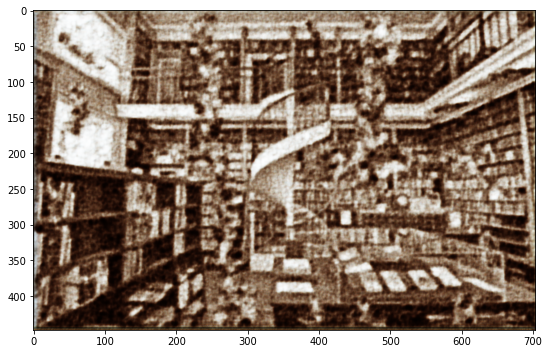

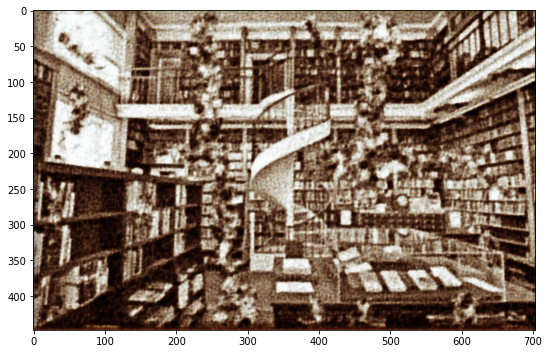

...

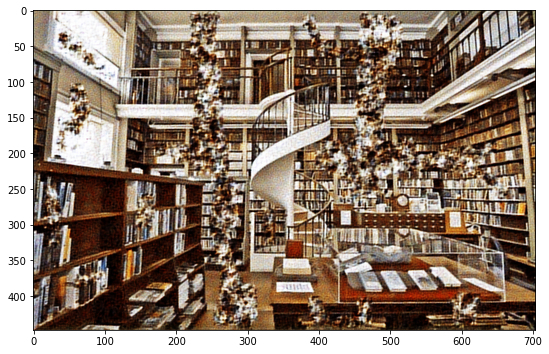

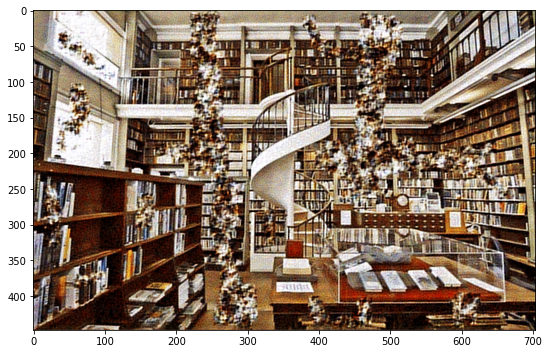

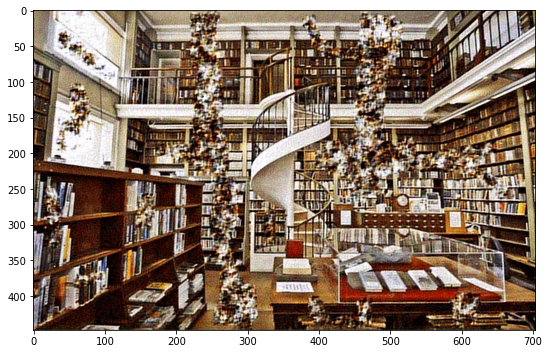

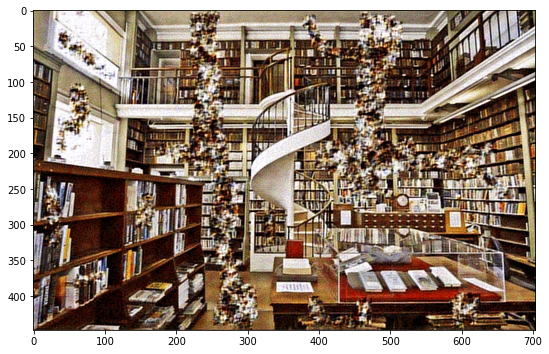

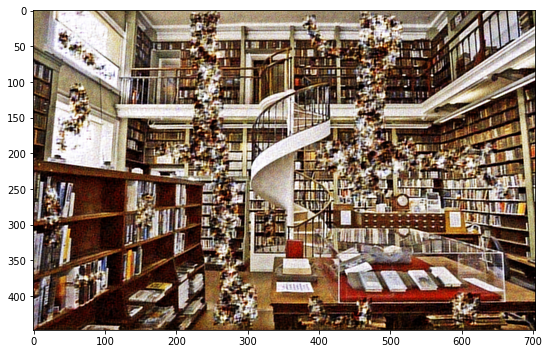

In [18]:
i = 0
def closure():
    
    global i
    
    if param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50
    
    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
        
        
    out = net(net_input)
   
    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()
        
    
    if (PLOT and i<=500 and i % 100 == 0) or (PLOT and i % show_every == 0):
        print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)
        
    i += 1

    return total_loss

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)